# 深度学习课程设计报告

## 一、封面

- 课程名称：深度学习  
- 设计题目：基于CNN的玉米叶片病害识别系统 
- 姓    名：朱可  
- 学    号：20234080201  
- 班    级：本23数据02班  
- 指导教师：丁平尖  
- 提交日期：2026年6月24日  

## 二、摘要

> 玉米是重要的粮食作物之一，玉米叶片病害会影响植株光合作用和正常生长，进而降低作物产量。传统病害识别主要依赖人工观察，存在效率低、难以及时发现病害等问题。针对上述问题，我设计并实现了一个基于卷积神经网络（CNN）的玉米叶片病害识别系统，用于对玉米叶片图像进行自动分类。选取 PlantVillage 公开数据集中玉米相关的健康叶片、灰斑病、普通锈病和北方叶枯病四类图像，每类 500 张，划分为训练集、验证集和测试集。在方法上，首先对图像进行尺寸统一、归一化和数据增强处理；然后构建由多组卷积层、批归一化层、ReLU 激活函数、最大池化层、Dropout 层和全连接层组成的 CNN 模型，提取叶片颜色、纹理和病斑形态特征；最后采用交叉熵损失函数和 Adam 优化器进行训练。实验结果表明，模型在测试集上的准确率达到 96.0%，能够较好地区分四类玉米叶片状态，具有一定的农业病害辅助识别价值。

## 三、问题定义与需求分析


### 3.1 项目背景与意义

> 玉米是重要的粮食作物之一，在农业生产和粮食安全中具有重要地位。在玉米生长过程中，叶片容易受到灰斑病、普通锈病、北方叶枯病等病害影响。这些病害会破坏叶片组织，降低植株光合作用效率，严重时会影响玉米产量和品质。因此，及时、准确地识别玉米叶片病害，对于农业生产管理和病害防治具有重大意义。

>本次课程设计选题来源于深度学习在农业图像识别领域的应用。传统玉米叶片病害识别主要依赖人工观察和经验判断，存在识别效率低、主观性强、对专业知识依赖较高等问题，难以满足大规模、快速化和智能化农业生产的需求。卷积神经网络（CNN）能够自动提取图像中的颜色、纹理、边缘和局部病斑等特征，适合用于植物叶片病害图像分类任务。

>因此，本次课程设计以玉米叶片图像为研究对象，构建基于 CNN 的玉米叶片病害识别系统，实现对健康叶片、灰斑病、普通锈病和北方叶枯病四类状态的自动识别。该系统可为玉米病害的辅助诊断和智能农业检测提供参考，具有一定的实际应用价值。

### 3.2 问题描述

输入输出定义如下：
>```text
>输入：一张玉米叶片图像
>输出：图像对应的叶片状态类别，包括健康叶片、灰斑病、普通锈病和北方叶枯病四类
>类别标签：`healthy`、`gray_leaf_spot`、`common_rust`、`northern_leaf_blight`

任务类型如下：
>```text
>任务类型：图像多分类任务
>模型方法：基于卷积神经网络（CNN）进行特征提取和分类预测

本次课程设计的预期性能指标如下：
>```text
>准确率（Accuracy）：衡量模型整体分类正确的比例
>精确率（Precision）：衡量模型预测为某一类别的样本中实际属于该类别的比例
>召回率（Recall）：衡量某一真实类别样本被模型正确识别出来的比例
>F1 值（F1-score）：综合反映精确率和召回率
>混淆矩阵（Confusion Matrix）：用于分析不同类别之间的误分类情况


## 四、数据集说明与预处理

### 4.1 数据来源与规模

>本次课程设计使用公开植物病害图像数据集 PlantVillage。PlantVillage 数据集中包含多种作物的健康叶片和病害叶片图像，适用于植物病害识别、农业图像分类等深度学习任务。

>本次课程设计从 PlantVillage 数据集中选取玉米作物相关的四类叶片图像作为实验数据，分别为健康叶片、灰斑病、普通锈病和北方叶枯病。为了保证类别均衡，每类选取 500 张图片，共 2000 张图像。数据集按照训练集、验证集和测试集进行划分，其中每类训练集 400 张、验证集 50 张、测试集 50 张。

In [1]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from src.config import CFG, CLASS_NAME_ZH
from src.data import dataset_summary
from src.utils import setup_matplotlib_chinese

setup_matplotlib_chinese()

summary_df = dataset_summary(CFG.data_dir)
summary_df

,split,class,class_zh,count
0,train,common_rust,普通锈病,400
1,train,gray_leaf_spot,灰斑病,400
2,train,healthy,健康叶片,400
3,train,northern_leaf_blight,北方叶枯病,400
4,val,common_rust,普通锈病,50
5,val,gray_leaf_spot,灰斑病,50
6,val,healthy,健康叶片,50
7,val,northern_leaf_blight,北方叶枯病,50
8,test,common_rust,普通锈病,50
9,test,gray_leaf_spot,灰斑病,50


>由上表可以看出，数据集类别分布较为均衡。四个类别在训练集、验证集和测试集中的样本数量一致，有利于减少类别不平衡对模型训练和评价结果的影响。

### 4.2 数据可视化与分析

> 为直观了解数据集内容，对玉米叶片图像进行可视化展示，并统计不同类别在训练集、验证集和测试集中的数量分布。由于处理的是图像数据，不同于结构化表格数据，因此不进行传统意义上的字段相关性分析，而是从类别分布、样本外观和病害视觉特征差异等角度进行分析。

<Axes: title={'center': '玉米叶片病害数据集类别分布'}, xlabel='类别', ylabel='图片数量'>

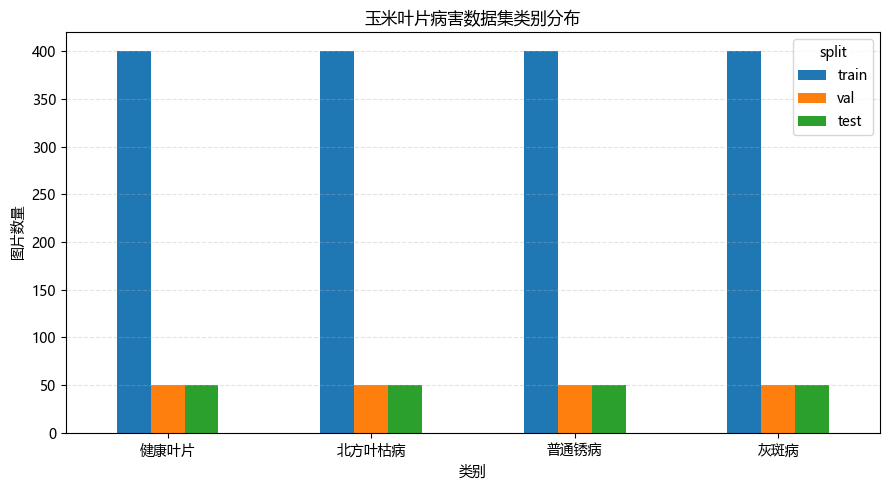

In [2]:
from src.data import plot_class_distribution

plot_class_distribution(summary_df)

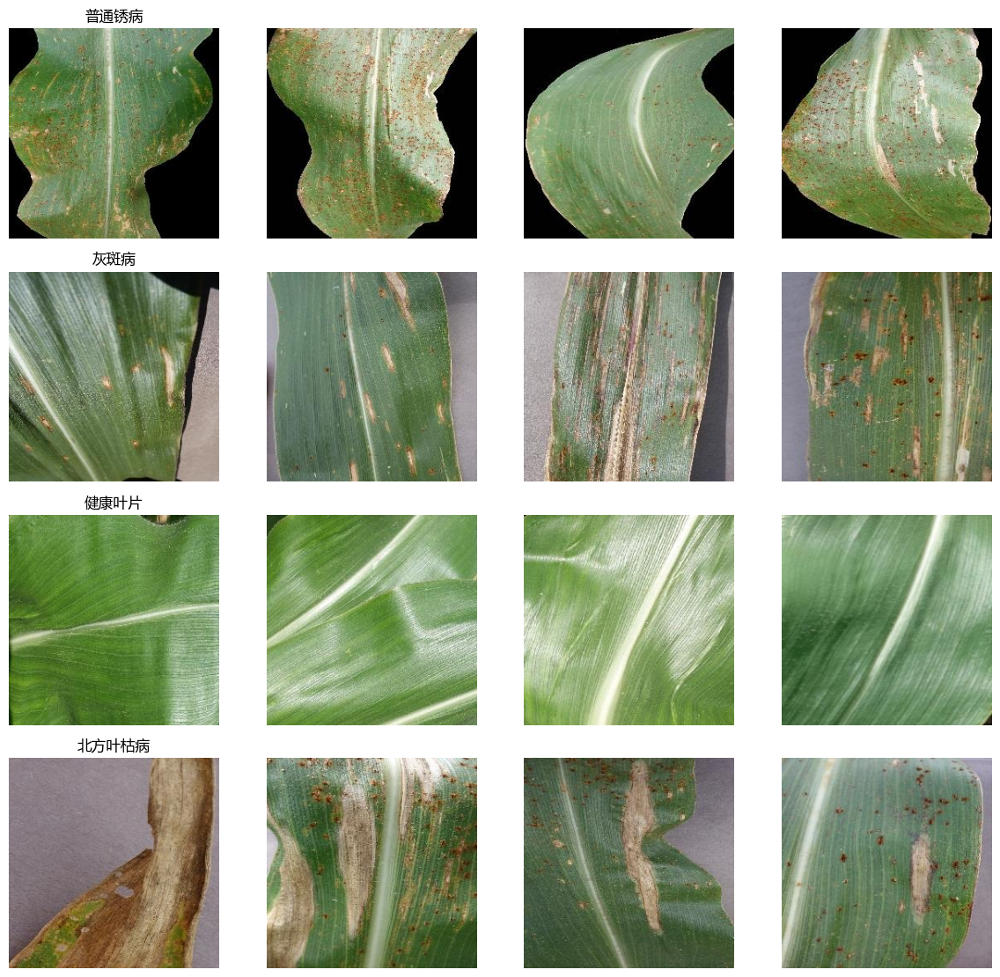

In [3]:
from src.data import show_dataset_samples

fig = show_dataset_samples(CFG.data_dir, split="train", samples_per_class=4)

>从样本图像可以观察到，不同类别的玉米叶片在颜色、纹理和病斑形态上存在一定差异。健康叶片整体颜色较均匀，病斑较少；普通锈病叶片通常具有较明显的锈色斑点；灰斑病和北方叶枯病都可能表现为叶片上的斑块或枯斑，因此二者在视觉特征上相对接近，后续模型可能更容易在这两类之间产生混淆。

### 4.3 预处理流程

> 为了使图像能够输入 CNN 模型，我对数据进行了统一预处理。首先，对原始图像进行检查，去除无法读取或格式异常的图片；其次，根据 PlantVillage 数据集原始类别名称，将样本整理到对应的类别文件夹中，完成所需的标签标注；然后，将输入图像统一调整为 `224×224` 大小，并进行张量转换和归一化处理。

>在训练阶段，为提高模型泛化能力，对训练集图像进行随机水平翻转、随机垂直翻转、随机旋转和颜色扰动等数据增强操作。验证集和测试集不进行随机增强，只进行尺寸统一、张量转换和归一化处理，以保证评价结果稳定。

In [4]:
from src.data import build_transforms

train_transform, eval_transform = build_transforms(CFG.image_size)

print("训练集预处理与增强：")
print(train_transform)

print("\n验证集/测试集预处理：")
print(eval_transform)

训练集预处理与增强：
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.2)
    RandomRotation(degrees=[-20.0, 20.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.85, 1.15), contrast=(0.85, 1.15), saturation=(0.88, 1.12), hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

验证集/测试集预处理：
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


In [5]:
from src.data import create_dataloaders

datasets_map, loaders = create_dataloaders(
    data_dir=CFG.data_dir,
    batch_size=CFG.batch_size,
    num_workers=CFG.num_workers
)

print("类别顺序：", datasets_map["train"].classes)
print("训练集样本数：", len(datasets_map["train"]))
print("验证集样本数：", len(datasets_map["val"]))
print("测试集样本数：", len(datasets_map["test"]))

类别顺序： ['common_rust', 'gray_leaf_spot', 'healthy', 'northern_leaf_blight']
训练集样本数： 1600
验证集样本数： 200
测试集样本数： 200


>本次课程设计的数据集划分如上：训练集共 1600 张图像，用于模型参数学习；验证集共 200 张图像，用于训练过程中观察模型泛化能力并保存最佳模型；测试集共 200 张图像，用于最终模型性能评价。保证模型训练、调参和最终测试过程相互独立。

## 五、模型设计与选择

### 5.1 基准模型（Baseline）

>为了验证卷积神经网络在玉米叶片病害识别任务中的有效性，首先设定一个简单的基准模型作为对比思路。基准模型可以采用线性分类器或小型多层感知机（MLP）。这类模型通常需要将图像像素展开为一维向量后输入全连接层进行分类。

>以 MLP 为例，输入图像经过尺寸统一后可表示为 `224×224×3` 的三维数组，若直接展开，则输入维度为 `150528`。模型通过若干全连接层和非线性激活函数完成四分类预测。该方法结构简单，易于实现，但存在明显不足：一方面，直接展开图像会破坏像素之间的空间结构；另一方面，全连接层参数量较大，难以有效提取叶片局部纹理、边缘和病斑形态等视觉特征。

>因此，基准模型只作为简单对照，最终选择卷积神经网络作为主要模型。CNN 能够利用卷积核在局部区域内共享参数，自动提取图像中的局部特征，更适合处理玉米叶片病害图像分类任务。

基准 MLP 模型结构可表示为：

>```text
>Input Image 224×224×3
>        ↓
>Flatten
>        ↓
>Linear + ReLU
>        ↓
>Dropout
>        ↓
>Linear
>        ↓
>Output 4 classes

### 5.2 最终模型架构

>本次课程设计采用自定义卷积神经网络 CornLeafCNN 作为玉米叶片病害识别模型。模型整体由特征提取部分和分类器部分组成。特征提取部分包含 4 个卷积块，每个卷积块由两层卷积层、批归一化层、ReLU 激活函数和最大池化层组成，并在部分卷积块后加入 Dropout 以缓解过拟合。分类器部分采用自适应平均池化、Dropout 和全连接层，将卷积特征映射到四个类别输出。

模型结构如下：

In [6]:
from src.model import create_model
from src.utils import count_parameters

model = create_model(num_classes=4)
model

CornLeafCNN(
  (features): Sequential(
    (0): ConvBlock(
      (block): Sequential(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (5): ReLU(inplace=True)
        (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (7): Dropout2d(p=0.05, inplace=False)
      )
    )
    (1): ConvBlock(
      (block): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size

In [7]:
print(f"模型可训练参数量：{count_parameters(model):,}")

模型可训练参数量：1,206,628


网络结构可以概括为：

>```text
>Input: 224×224×3
>        ↓
>ConvBlock 1: Conv(3→32) + BN + ReLU + Conv(32→32) + BN + ReLU + MaxPool
>        ↓
>ConvBlock 2: Conv(32→64) + BN + ReLU + Conv(64→64) + BN + ReLU + MaxPool
>        ↓
>ConvBlock 3: Conv(64→128) + BN + ReLU + Conv(128→128) + BN + ReLU + MaxPool
>        ↓
>ConvBlock 4: Conv(128→256) + BN + ReLU + Conv(256→256) + BN + ReLU + MaxPool
>        ↓
>Adaptive Average Pooling
>        ↓
>Flatten
>        ↓
>Dropout
>        ↓
>Linear(256→128) + ReLU
>        ↓
>Dropout
>        ↓
>Linear(128→4)
>        ↓
>Output: 4 classes

>在该模型中，卷积层用于提取叶片图像中的局部纹理、边缘、颜色变化和病斑形态特征；批归一化层用于稳定训练过程、加快收敛；ReLU 激活函数用于增强模型的非线性表达能力；最大池化层用于降低特征图尺寸、减少计算量并增强特征的平移鲁棒性；Dropout 用于随机抑制部分神经元，降低模型过拟合风险；自适应平均池化用于将不同空间位置的高级语义特征压缩为固定长度向量；最后通过全连接层输出四个类别的分类结果。

>理论依据：选择 CNN 作为最终模型的主要原因在于，植物叶片病害识别依赖图像中的局部视觉特征，例如病斑边缘、颜色变化、纹理分布和叶片局部坏死区域。卷积神经网络通过局部连接和权值共享机制，能够在较少参数量的情况下提取具有空间结构的图像特征。相比直接展开像素的线性分类器或 MLP，CNN 更能保留图像的二维空间关系，因此更适合玉米叶片病害识别任务。此外，多层卷积结构可以逐级提取由浅到深的特征：浅层卷积更关注边缘、颜色和纹理等基础特征，深层卷积则能够组合形成更抽象的病斑区域和类别判别特征。结合批归一化、Dropout 和数据增强等方法，可以提升模型训练稳定性和泛化能力。

## 六、实验与结果分析

### 6.1 实验环境

- 硬件：
>```text
>CPU：13th GenIntel(R)Core(TM)i7-13650HX         2.60 GHz
>内存：DDR5内存条M425R1GB4BB0-CWM        内存容量为8GB，内存频率为5600MHz

- 软件：
>```text
>操作系统：Windows
>编程语言：Python 3.14
>深度学习框架：PyTorch 2.12.0+cpu
>图像处理与数据加载：torchvision 0.27.0+cpu、Pillow、OpenCV
>数据处理与科学计算：NumPy、Pandas
>可视化工具：Matplotlib
>模型评价工具：scikit-learn


### 6.2 评价指标

- 本次课程设计采用准确率、精确率、召回率、F1 值和混淆矩阵作为主要评价指标。
>```text
>准确率（Accuracy）表示所有测试样本中被模型正确分类的比例，计算公式为：Accuracy = 正确分类样本数 / 总样本数
>精确率（Precision）表示模型预测为某一类别的样本中，实际也属于该类别的比例，计算公式为：Precision = TP / (TP + FP)
>召回率（Recall）表示某一真实类别样本中，被模型正确识别出来的比例，计算公式为：Recall = TP / (TP + FN)
>F1 值综合考虑精确率和召回率，计算公式为：F1-score = 2 × Precision × Recall / (Precision + Recall)
>其中，TP 表示真正例，FP 表示假正例，FN 表示假负例。混淆矩阵用于展示各类别真实标签与预测标签之间的对应关系，可以直观分析不同类别之间的误分类情况。



### 6.3 超参数设置与调优

- 本次课程设计采用自定义 CNN 模型进行训练，主要超参数设置如下：

In [8]:
from src.config import CFG

hyperparams = {
    "输入图像尺寸": f"{CFG.image_size} × {CFG.image_size}",
    "Batch Size": CFG.batch_size,
    "训练轮数": CFG.epochs,
    "学习率": CFG.learning_rate,
    "权重衰减": CFG.weight_decay,
    "优化器": "Adam",
    "损失函数": "CrossEntropyLoss",
    "学习率调度": "ReduceLROnPlateau",
    "随机种子": CFG.seed,
}

hyperparams

{'输入图像尺寸': '224 × 224',
 'Batch Size': 32,
 '训练轮数': 15,
 '学习率': 0.001,
 '权重衰减': 0.0001,
 '优化器': 'Adam',
 '损失函数': 'CrossEntropyLoss',
 '学习率调度': 'ReduceLROnPlateau',
 '随机种子': 2026}

>在调参过程中，首先使用较常见的学习率 `0.001` 和 Batch Size `32` 作为初始设置。考虑到数据集规模为 2000 张，模型参数量约为 120 万，为降低过拟合风险，在模型中加入 Dropout 和权重衰减，并对训练集进行随机翻转、随机旋转和颜色扰动等数据增强。训练过程中使用验证集准确率作为模型选择依据，当验证集准确率提升时保存当前模型权重。

有效调参记录如下：
>```text
>初始学习率设置为 `0.001`，模型能够稳定收敛。
>Batch Size 设置为 `32`，在 CPU 环境下训练速度和稳定性较为平衡。
>使用 `Dropout` 和 `weight_decay=1e-4` 后，有助于缓解训练集和验证集之间的性能差异。
>使用 `ReduceLROnPlateau` 根据验证集准确率动态调整学习率，在验证准确率提升变慢后降低学习率。
>最终训练 15 轮，在第 10 轮取得最佳验证集准确率 `94.5%`。

### 6.4 主要实验结果

- 展示模型训练过程和测试集评价结果。实验过程中记录每一轮训练损失、训练准确率、验证损失和验证准确率，并在训练结束后使用测试集进行最终评价。


In [9]:
import pandas as pd
from IPython.display import display, Image

history_df = pd.read_csv("outputs/training_history.csv")
report_df = pd.read_csv("outputs/classification_report.csv")

display(history_df)

,epoch,train_loss,train_acc,val_loss,val_acc,lr
0,1,0.684997,0.720625,0.448554,0.770,0.0010
1,2,0.487123,0.786875,0.333602,0.820,0.0010
2,3,0.388703,0.828750,0.315185,0.840,0.0010
3,4,0.358623,0.834375,0.227201,0.910,0.0010
4,5,0.318325,0.871250,0.327653,0.825,0.0010
5,6,0.289294,0.868125,0.215345,0.910,0.0010
6,7,0.300545,0.881875,0.290694,0.895,0.0010
7,8,0.271858,0.894375,0.214035,0.920,0.0010
8,9,0.251177,0.906250,0.182773,0.925,0.0010
9,10,0.242509,0.903125,0.183063,0.945,0.0010


训练曲线

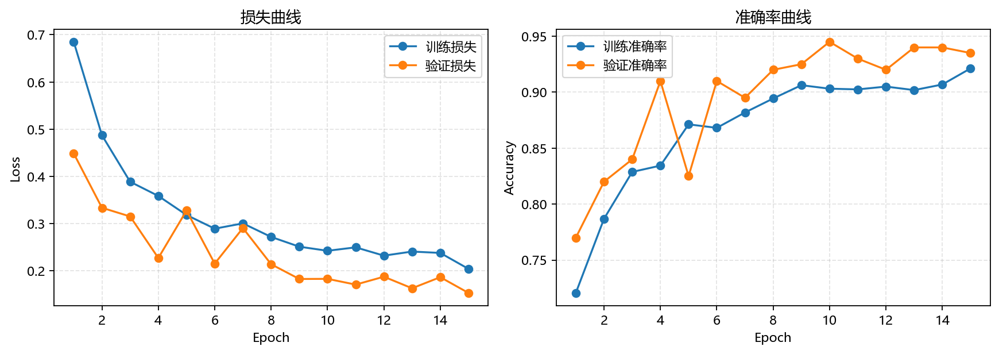

In [10]:
Image(filename="outputs/training_curves.png")

分类报告

In [11]:
display(report_df)

,Unnamed: 0,precision,recall,f1-score,support
0,普通锈病,1.000000,1.00,1.000000,50.00
1,灰斑病,0.977273,0.86,0.914894,50.00
2,健康叶片,1.000000,1.00,1.000000,50.00
3,北方叶枯病,0.875000,0.98,0.924528,50.00
4,accuracy,0.960000,0.96,0.960000,0.96
5,macro avg,0.963068,0.96,0.959855,200.00
6,weighted avg,0.963068,0.96,0.959855,200.00


混淆矩阵

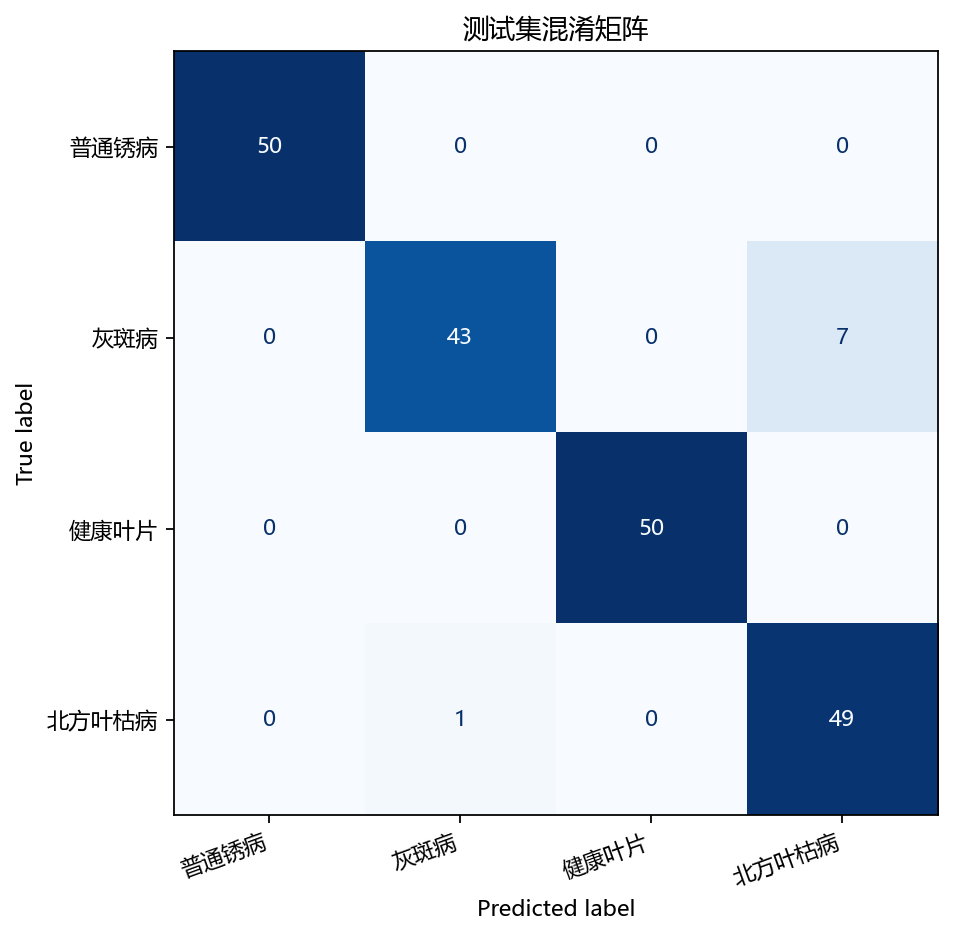

In [12]:
Image(filename="outputs/confusion_matrix.png")

>```text
>从训练曲线可以看出，随着训练轮数增加，训练损失整体下降，训练准确率逐步上升，说明模型能够从玉米叶片图像中学习到有效特征。验证集准确率在训练过程中整体保持上升趋势，最佳验证集准确率出现在第 10 轮，达到 `94.5%`。后续训练中验证集准确率略有波动，说明模型已经基本收敛。
>从测试集分类报告可以看出，模型在测试集上的总体准确率为 `96.0%`。其中，普通锈病和健康叶片的 Precision、Recall 和 F1-score 均达到 `1.000`，说明模型对这两类特征较为明显的样本识别效果较好。灰斑病的召回率为 `0.860`，低于其他类别，说明部分灰斑病样本被误分到其他类别。北方叶枯病的召回率为 `0.980`，但精确率为 `0.875`，说明有部分其他类别样本被预测为北方叶枯病。
>本次课程设计没有额外训练复杂预训练模型，而是以简单 MLP 作为基准模型思路，并最终采用自定义 CNN 模型完成实验。相比直接展开图像像素的 MLP，CNN 能够保留图像空间结构并提取局部纹理和病斑特征，因此更适合图像分类任务。

### 6.5 可视化分析

- 为了进一步分析模型的学习效果，这里从卷积核、特征图、Grad-CAM 注意力热力图、错误样本和混淆矩阵等方面进行可视化分析。

卷积核

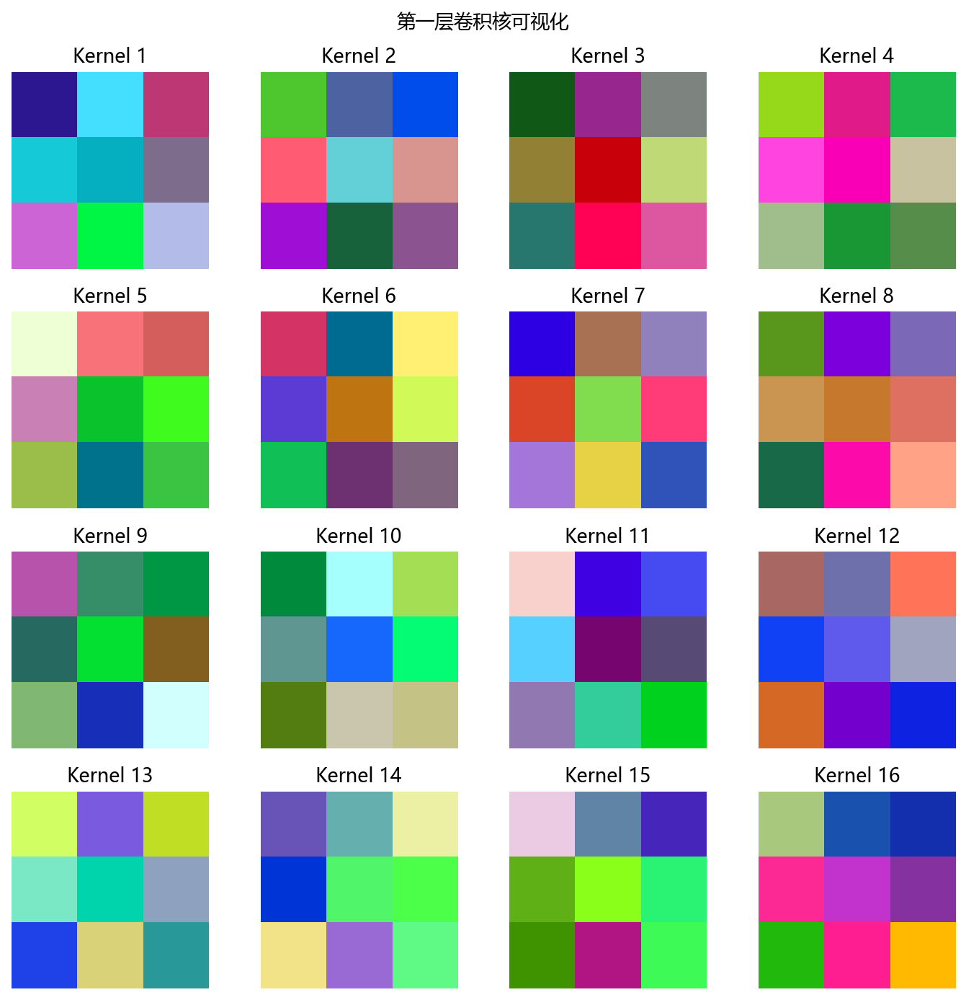

In [13]:
Image(filename="outputs/conv_kernels.png")

>第一层卷积核主要用于提取图像中的基础视觉特征，例如颜色变化、边缘方向和局部纹理。通过卷积核可视化可以观察模型在输入层附近学习到的低级图像特征。

浅层特征图

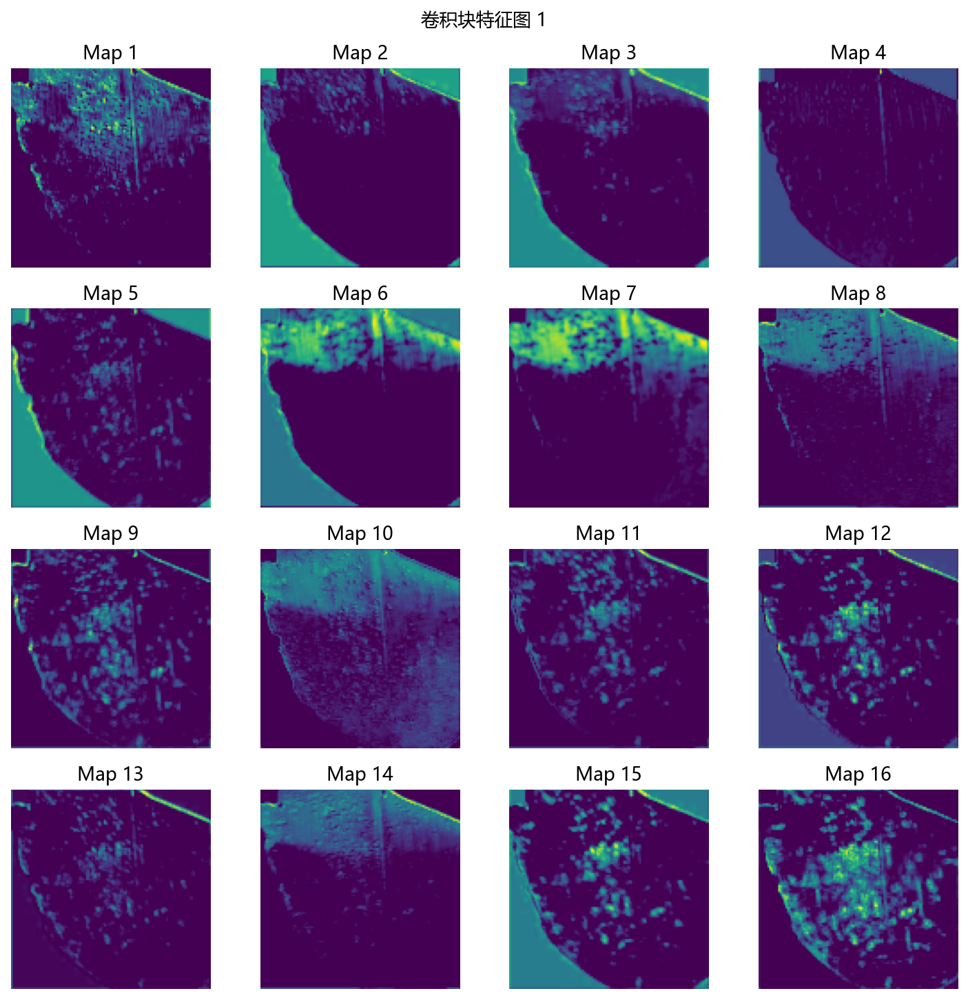

In [14]:
Image(filename="outputs/feature_maps_block1.png")

深层特征图

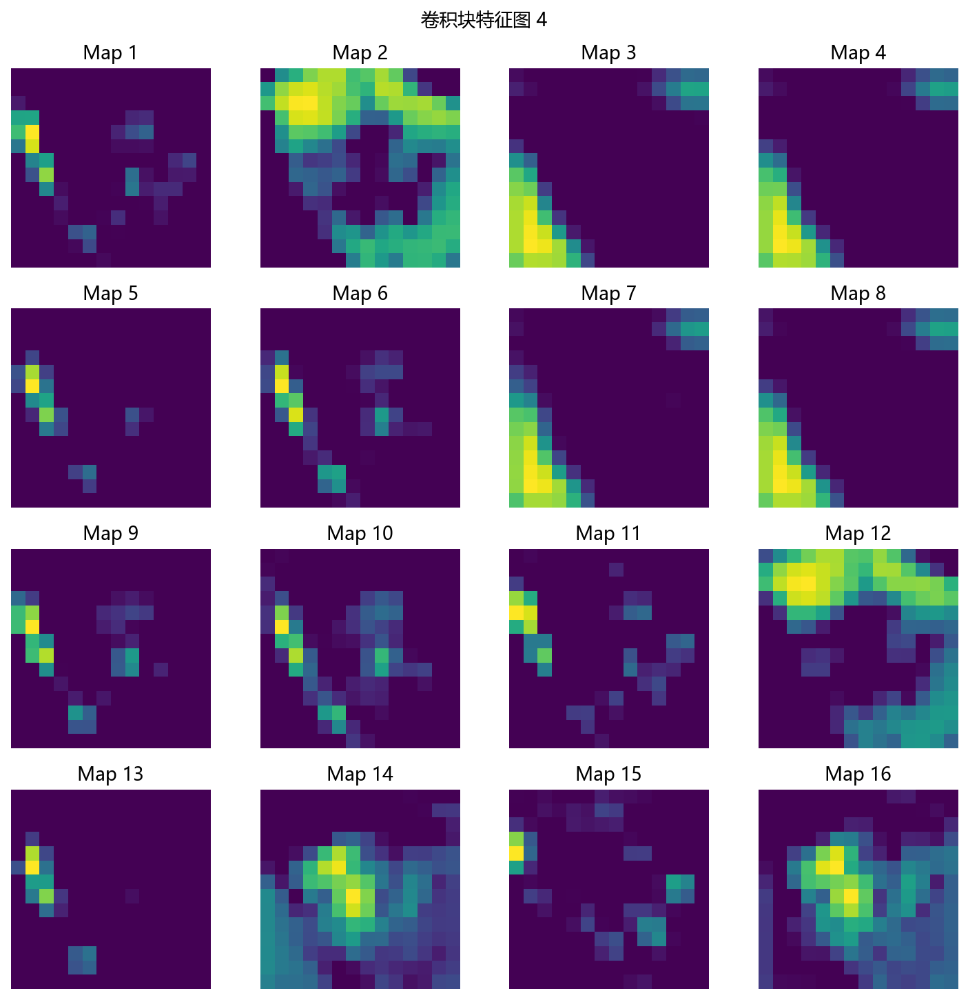

In [15]:
Image(filename="outputs/feature_maps_block4.png")

>浅层特征图通常保留较多的边缘、颜色和纹理信息，可以反映叶片轮廓和局部斑点等基础特征。深层特征图经过多次卷积和池化后，空间尺寸减小，特征表达更加抽象，更关注与类别判别相关的病斑区域和纹理组合。

Grad-CAM 热力图

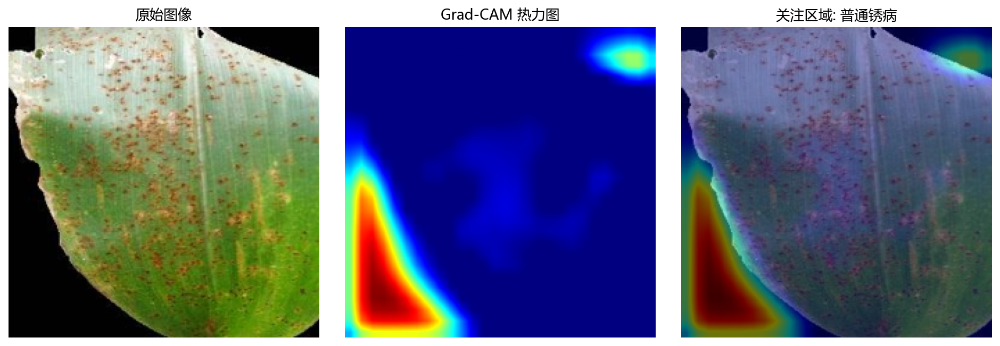

In [16]:
Image(filename="outputs/gradcam_01.png")

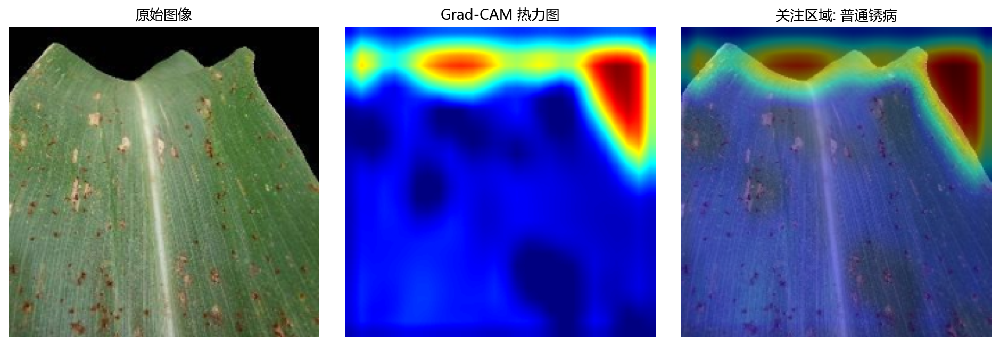

In [17]:
Image(filename="outputs/gradcam_02.png")

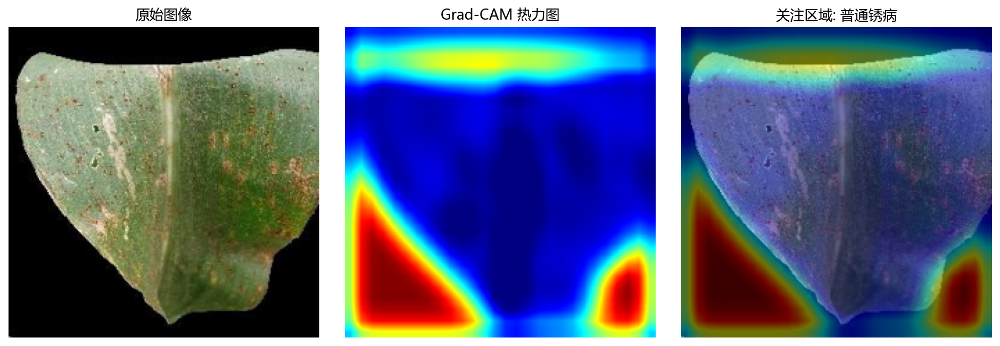

In [18]:
Image(filename="outputs/gradcam_03.png")

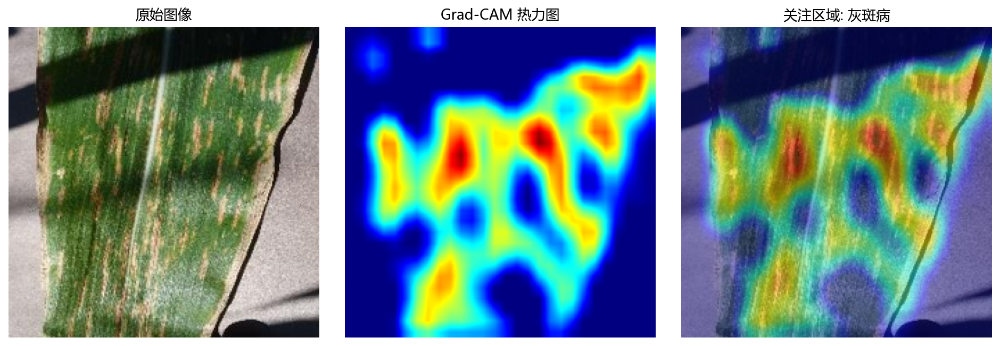

In [19]:
Image(filename="outputs/gradcam_04.png")

>Grad-CAM 热力图用于观察模型在进行分类预测时重点关注的图像区域。由可视化结果可以看出，模型通常会关注叶片上的病斑、颜色异常区域和纹理变化明显的位置，而不是仅依赖图像背景进行判断。这说明 CNN 模型在一定程度上学习到了与玉米叶片病害相关的判别特征。

错误样本

In [20]:
misclassified_df = pd.read_csv("outputs/misclassified_samples.csv")
display(misclassified_df)

,image_path,true_label,pred_label,true_label_zh,pred_label_zh
0,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
1,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
2,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
3,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
4,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
5,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
6,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,gray_leaf_spot,northern_leaf_blight,灰斑病,北方叶枯病
7,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_leaf_dataset\te...,northern_leaf_blight,gray_leaf_spot,北方叶枯病,灰斑病


错误样本网格

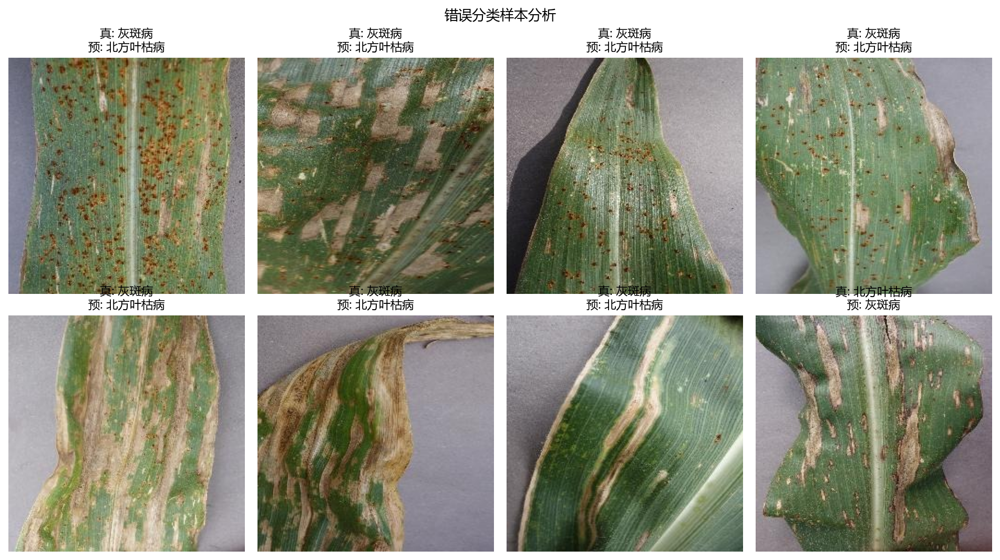

In [21]:
Image(filename="outputs/misclassified_grid.png")

>错误样本分析显示，模型的误分类主要集中在灰斑病和北方叶枯病之间。这两类病害在部分样本中都可能表现为叶片上的不规则斑块、枯黄区域或长条状病斑，视觉特征存在一定相似性，因此容易导致模型判断错误。相比之下，普通锈病通常具有较明显的锈色斑点，健康叶片病斑较少，因此识别效果更好。

混淆矩阵

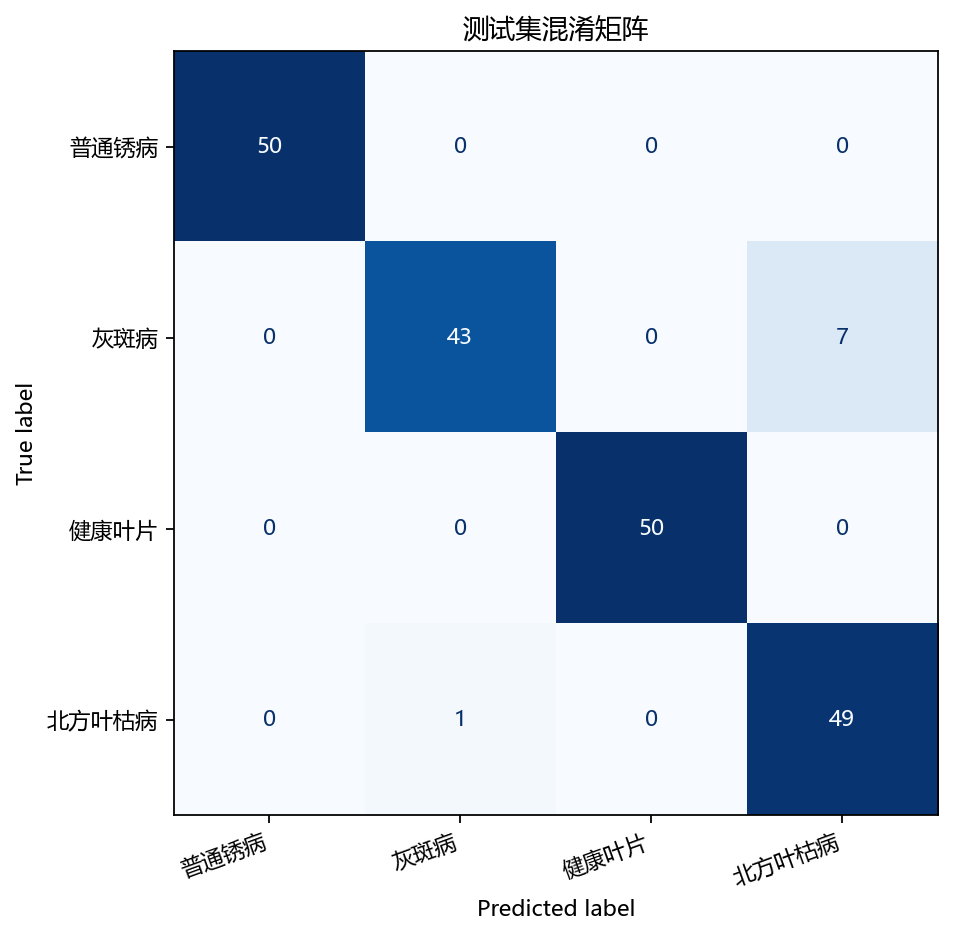

In [22]:
Image(filename="outputs/confusion_matrix.png")

>结合混淆矩阵可以进一步看出，普通锈病和健康叶片几乎没有误分类，而灰斑病与北方叶枯病之间存在一定混淆。这与错误样本分析结果一致，说明模型在区分视觉特征相近病害时仍有提升空间。

## 七、系统功能展示

- 为了验证模型在单张图像预测场景中的使用效果，这里调用训练完成并保存的最佳 CNN 模型，对 `corn_predict_images` 文件夹中的玉米叶片图片进行预测。系统输入为一张玉米叶片图像，输出为该图像所属类别及预测置信度。

In [23]:
#加载模型
from src.model import create_model
from src.train import load_best_weights
from src.data import create_dataloaders
from src.config import CFG

datasets_map, loaders = create_dataloaders(
    data_dir=CFG.data_dir,
    batch_size=CFG.batch_size,
    num_workers=CFG.num_workers
)

best_model = create_model(num_classes=4)
best_model, checkpoint = load_best_weights(best_model, CFG.best_model_path)

print(f"加载最佳模型：第 {checkpoint['epoch']} 轮")
print(f"验证集准确率：{checkpoint['val_acc']:.4f}")

加载最佳模型：第 10 轮
验证集准确率：0.9450


In [24]:
#读取预测结果表
import pandas as pd

prediction_df = pd.read_csv("outputs/prediction_results.csv")
prediction_df

,image_path,pred_label,pred_label_zh,confidence
0,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,common_rust,普通锈病,0.985342
1,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,common_rust,普通锈病,0.997501
2,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,common_rust,普通锈病,0.999964
3,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,gray_leaf_spot,灰斑病,0.993641
4,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,gray_leaf_spot,灰斑病,0.774555
5,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,gray_leaf_spot,灰斑病,0.849605
6,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,healthy,健康叶片,0.999675
7,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,healthy,健康叶片,0.999920
8,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,healthy,健康叶片,0.999925
9,D:\南华学业\学校用\大三下\深度学习\课程设计\corn_predict_images\...,northern_leaf_blight,北方叶枯病,0.914774


In [25]:
#单张图片预测并展示
from pathlib import Path
from src.predict import predict_image, plot_prediction

image_path = sorted(Path(CFG.predict_dir).glob("*.jpg"))[0]

result = predict_image(
    best_model,
    image_path,
    class_names=datasets_map["test"].classes
)

result

{'image_path': WindowsPath('D:/南华学业/学校用/大三下/深度学习/课程设计/corn_predict_images/plantvillage_common_rust_07.jpg'),
 'pred_index': 0,
 'pred_label': 'common_rust',
 'pred_label_zh': '普通锈病',
 'confidence': 0.9853416681289673,
 'probabilities': {'common_rust': 0.9853416681289673,
  'gray_leaf_spot': 0.0032484906259924173,
  'healthy': 0.01088620349764824,
  'northern_leaf_blight': 0.0005234879208728671}}

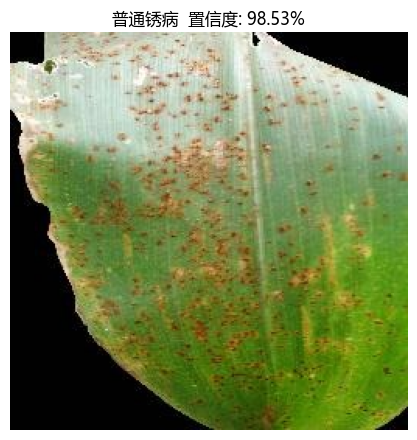

In [26]:
#展示预测图片
plot_prediction(result);

>从预测结果可以看出，系统能够对输入的玉米叶片图像给出对应的病害类别和预测置信度。该功能模拟了实际应用中用户上传玉米叶片图片后，系统自动返回识别结果的过程。当前系统已经具备图像输入、模型推理和结果输出的基本功能，能够作为玉米叶片病害辅助识别系统的原型。

## 八、总结

>```text
>     本次课程设计围绕玉米叶片病害识别问题，设计并实现了一个基于卷积神经网络（CNN）的图像分类系统。实验选取 PlantVillage 公开数据集中玉米相关的四类叶片图像，包括健康叶片、灰斑病、普通锈病和北方叶枯病，每类 500 张，共 2000 张图像，并按照训练集、验证集和测试集进行划分。
>     在数据处理方面，本次课程设计对图像进行了尺寸统一、归一化和数据增强处理，以提高模型训练稳定性和泛化能力。在模型设计方面，构建了由多组卷积层、批归一化层、ReLU 激活函数、最大池化层、Dropout 层和全连接层组成的 CNN 模型，用于提取叶片图像中的颜色、纹理和病斑形态特征。实验采用交叉熵损失函数和 Adam 优化器进行训练，并根据验证集准确率保存最佳模型。
>     实验结果表明，模型在测试集上的准确率达到 96.0%，能够较好地区分四类玉米叶片状态。通过训练曲线、分类报告、混淆矩阵、错误样本、卷积核、特征图和 Grad-CAM 热力图等分析可以看出，模型能够学习到与病害识别相关的局部特征。其中，普通锈病和健康叶片识别效果较好，而灰斑病与北方叶枯病之间仍存在一定混淆，说明模型在区分视觉特征相近类别时仍有改进空间。
>     通过本次课程设计，我进一步理解了卷积神经网络在图像分类任务中的基本流程，包括数据集整理、图像预处理、模型构建、训练优化、结果评价和可视化分析等环节。系统仍有改进空间，本次设计为深度学习在农业病害识别中的应用提供了一个实践案例，也为我后续进一步优化模型和拓展实际应用打下了基础。